# 💠 Dimensinality reduction 

![dim_red](gifs/dim_red.gif "segment")
    
### In this notebook, I experiment with different algorithms to transform the claims dataframe into a convenient one before feeding it to the clustering model

In [1]:
!pip install yellowbrick --q
!pip install threadpoolctl --upgrade --q

In [1]:
import datetime

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib import colors
import plotly.express as px
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans
from kmodes.kmodes import KModes
from sklearn.cluster import AgglomerativeClustering
from matplotlib.colors import ListedColormap
from sklearn import metrics

import warnings
import sys
if not sys.warnoptions:
    warnings.simplefilter("ignore")
np.random.seed(42)

In [2]:
pd.set_option('display.max_columns', None)

In [3]:
df = pd.read_csv(r"data/df_cleaned_v3.csv")

In [4]:
df = df.drop('CLAIMNUMBER', axis=1)

In [5]:
df

,Risk_grp,NORTWMODIFIEDWORKOFFERED,PRIORSIMILARCOND_WC,ZACCDNT_CAT_OPTNS_CD,ACCIDENTCONCERN_WC,ZNTR_OF_ACDNT_CD,HICFlag,ZACCDNT_ILLNESS_CAT_CD,WSIB_FORMTYPENAME,ZAREA_INJURY1_CD,FULL_TIME_WRKR_BAND,FIRM_IND_SCTR_DESC,GECA_Ind,InitialEadjType,SCHEDULE_TYPE,ClaimType_WCNAME_LT
0,Unknown,N,N,RepetitiveForce,N,RepetativeStrainTypeInjury,unknown,GraduallyOccuringOverTime,Form 6,Chest,Unknown,SCHEDULE 2,N,LT,second,LT
1,Unknown,N,N,Struck,N,SprainStrainTypeInjury,unknown,SuddenSpecificEventOccurence,Form 6,RightArm,Less than 20,CONSTRUCTION,N,LT,first,LT
2,Unknown,N,N,Struck,N,CutLaceration,unknown,SuddenSpecificEventOccurence,Form 6,LeftAnkle,Less than 20,SERVICES,N,LT,first,LT
3,Unknown,N,N,Burn,N,Burn,unknown,SuddenSpecificEventOccurence,Form 6,Eyes,Less than 20,SERVICES,N,LT,first,LT
4,Unknown,N,N,CutLaceration,N,CutLaceration,unknown,SuddenSpecificEventOccurence,Form 6,RightFingers,Less than 20,SERVICES,N,LT,first,LT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103413,Unknown,N,Y,Overexertion,N,SprainStrainTypeInjury,Lower Back,GraduallyOccuringOverTime,Form 7,BackLower,Greater than 100,HEALTH CARE,N,LT,first,LT
103414,RG10,Unknown,N,Struck,N,Burn,unknown,SuddenSpecificEventOccurence,Form 7,Eyes,Less than 20,CONSTRUCTION,N,NL,first,NL
103415,RG02,N,Y,Reach,N,RepetativeStrainTypeInjury,Shoulder,SuddenSpecificEventOccurence,Form 7,LeftShoulder,Greater than 100,AUTOMOTIVE,N,NL,first,NL
103416,RG02,N,Y,Reach,N,RepetativeStrainTypeInjury,Shoulder,SuddenSpecificEventOccurence,Form 7,LeftShoulder,Greater than 100,AUTOMOTIVE,N,NL,first,NL


In [6]:
df_encoded = pd.get_dummies(df, columns=df.columns, drop_first=True)

In [8]:
df_encoded

,Risk_grp_RG02,Risk_grp_RG03,Risk_grp_RG04,Risk_grp_RG05,Risk_grp_RG06,Risk_grp_RG07,Risk_grp_RG08,Risk_grp_RG09,Risk_grp_RG10,Risk_grp_Unknown,NORTWMODIFIEDWORKOFFERED_Unknown,NORTWMODIFIEDWORKOFFERED_Y,PRIORSIMILARCOND_WC_Unknown,PRIORSIMILARCOND_WC_Y,ZACCDNT_CAT_OPTNS_CD_Assault,ZACCDNT_CAT_OPTNS_CD_AwkwardPosition,ZACCDNT_CAT_OPTNS_CD_Bend,ZACCDNT_CAT_OPTNS_CD_BodyFluidExposure,ZACCDNT_CAT_OPTNS_CD_Burn,ZACCDNT_CAT_OPTNS_CD_Caught,ZACCDNT_CAT_OPTNS_CD_ChemicalSplash,ZACCDNT_CAT_OPTNS_CD_CutLaceration,ZACCDNT_CAT_OPTNS_CD_ExposureReportWithoutInjury,ZACCDNT_CAT_OPTNS_CD_FaintingSeizure,ZACCDNT_CAT_OPTNS_CD_Fall,ZACCDNT_CAT_OPTNS_CD_FightingHorseplay,ZACCDNT_CAT_OPTNS_CD_FireExplosion,ZACCDNT_CAT_OPTNS_CD_ForeignBody,ZACCDNT_CAT_OPTNS_CD_Frostbite,ZACCDNT_CAT_OPTNS_CD_IncorrectErgonomics,ZACCDNT_CAT_OPTNS_CD_InsectBiteSting,ZACCDNT_CAT_OPTNS_CD_Lift,ZACCDNT_CAT_OPTNS_CD_MachineryEquipmentMalfunction,ZACCDNT_CAT_OPTNS_CD_MotorVehicleAccident,ZACCDNT_CAT_OPTNS_CD_Needlestick,ZACCDNT_CAT_OPTNS_CD_OtherTransportation,ZACCDNT_CAT_OPTNS_CD_Overexertion,ZACCDNT_CAT_OPTNS_CD_Pain,ZACCDNT_CAT_OPTNS_CD_ProlongedPosition,ZACCDNT_CAT_OPTNS_CD_PushPull,ZACCDNT_CAT_OPTNS_CD_Reach,ZACCDNT_CAT_OPTNS_CD_RepetitiveForce,ZACCDNT_CAT_OPTNS_CD_RepetitiveMovement,ZACCDNT_CAT_OPTNS_CD_SlipTrip,ZACCDNT_CAT_OPTNS_CD_Struck,ZACCDNT_CAT_OPTNS_CD_SunHeatExposure,ZACCDNT_CAT_OPTNS_CD_Twist,ZACCDNT_CAT_OPTNS_CD_UnaccustomedMovement,ZACCDNT_CAT_OPTNS_CD_Unknown,ACCIDENTCONCERN_WC_Unknown,ACCIDENTCONCERN_WC_Y,ZNTR_OF_ACDNT_CD_Amputation,ZNTR_OF_ACDNT_CD_BodyFluidExposure,ZNTR_OF_ACDNT_CD_BruiseContusionTypeInjury,ZNTR_OF_ACDNT_CD_Burn,ZNTR_OF_ACDNT_CD_Cancer,ZNTR_OF_ACDNT_CD_ChemicalSplash,ZNTR_OF_ACDNT_CD_Covid-19,ZNTR_OF_ACDNT_CD_CumPsycoEvent,ZNTR_OF_ACDNT_CD_CutLaceration,ZNTR_OF_ACDNT_CD_DegenerativeDiscDisease,ZNTR_OF_ACDNT_CD_DermatitisOtherSkinCondition,ZNTR_OF_ACDNT_CD_DiscHerniation,ZNTR_OF_ACDNT_CD_ElectricShock,ZNTR_OF_ACDNT_CD_Faint,ZNTR_OF_ACDNT_CD_ForeignBodyInEye,ZNTR_OF_ACDNT_CD_FractureBreak,ZNTR_OF_ACDNT_CD_Frostbite,ZNTR_OF_ACDNT_CD_FumesInhalation,ZNTR_OF_ACDNT_CD_HandArmVibrationSyndrome,ZNTR_OF_ACDNT_CD_Harassment,ZNTR_OF_ACDNT_CD_HeartConditionStroke,ZNTR_OF_ACDNT_CD_Hernia,ZNTR_OF_ACDNT_CD_HumanScratch,ZNTR_OF_ACDNT_CD_InfectionCommunicableDisease,ZNTR_OF_ACDNT_CD_InsectBiteSting,ZNTR_OF_ACDNT_CD_LossConsciousness,ZNTR_OF_ACDNT_CD_MajorBurns,ZNTR_OF_ACDNT_CD_MajorCrushInjuriesInvolvingInternalInjuries,ZNTR_OF_ACDNT_CD_MajorHeadInjury,ZNTR_OF_ACDNT_CD_MultipleAmputations,ZNTR_OF_ACDNT_CD_MultipleFractures,ZNTR_OF_ACDNT_CD_NeedleStick,ZNTR_OF_ACDNT_CD_NoiseInducedHearingLoss,ZNTR_OF_ACDNT_CD_PlantarFaciitis,ZNTR_OF_ACDNT_CD_Rash,ZNTR_OF_ACDNT_CD_RepetativeStrainTypeInjury,ZNTR_OF_ACDNT_CD_Respiratory,ZNTR_OF_ACDNT_CD_Seizure,ZNTR_OF_ACDNT_CD_SinglePsycoEvent,ZNTR_OF_ACDNT_CD_SpinalCordInjuriesWithParalysis,ZNTR_OF_ACDNT_CD_SprainStrainTypeInjury,ZNTR_OF_ACDNT_CD_SunHeatExposure,ZNTR_OF_ACDNT_CD_ToxicReaction,ZNTR_OF_ACDNT_CD_Unknown,ZNTR_OF_ACDNT_CD_VaccineReaction,HICFlag_Lower Back,HICFlag_MTBI,HICFlag_Shoulder,HICFlag_Unknown,HICFlag_unknown,ZACCDNT_ILLNESS_CAT_CD_GraduallyOccuringOverTime,ZACCDNT_ILLNESS_CAT_CD_OccupationalDisease,ZACCDNT_ILLNESS_CAT_CD_PsychologicalCondition,ZACCDNT_ILLNESS_CAT_CD_SuddenSpecificEventOccurence,ZACCDNT_ILLNESS_CAT_CD_Unknown,WSIB_FORMTYPENAME_Correspondence,WSIB_FORMTYPENAME_Form 6,WSIB_FORMTYPENAME_Form 7,WSIB_FORMTYPENAME_Form 8,WSIB_FORMTYPENAME_Medical,WSIB_FORMTYPENAME_Unknown,ZAREA_INJURY1_CD_BackLower,ZAREA_INJURY1_CD_BackUpper,ZAREA_INJURY1_CD_Chest,ZAREA_INJURY1_CD_Ears,ZAREA_INJURY1_CD_Eyes,ZAREA_INJURY1_CD_Face,ZAREA_INJURY1_CD_Glasses,ZAREA_INJURY1_CD_Groin,ZAREA_INJURY1_CD_Head,ZAREA_INJURY1_CD_Internal,ZAREA_INJURY1_CD_LeftAnkle,ZAREA_INJURY1_CD_LeftArm,ZAREA_INJURY1_CD_LeftElbow,ZAREA_INJURY1_CD_LeftFingers,ZAREA_INJURY1_CD_LeftFoot,ZAREA_INJURY1_CD_LeftForearm,ZAREA_INJURY1_CD_LeftHand,ZAREA_INJURY1_CD_LeftHip,ZAREA_INJURY1_CD_LeftKnee,ZAREA_INJURY1_CD_LeftLowerLeg,ZAREA_INJURY1_CD

In [ ]:
# df_encoded.to_csv(r"data/df_encoded.csv", index=False)

---

## <span style='color:#ff5f27'>🤖 Dimensinality reduction for visualization purposes

### [t-SNE (t-distributed Stochastic Neighbor Embedding )](https://www.datacamp.com/tutorial/introduction-t-sne)

In [ ]:
from sklearn.manifold import TSNE


# Assuming df_encoded is your one-hot encoded DataFrame
tsne = TSNE(n_components=3, perplexity=30, n_iter=1000, random_state=42)
df_tsne = tsne.fit_transform(df_encoded)

Btw, it took 65 minutes to compute it.


After additional exploration, I think I should have used UMAP here. Basically, UMAP is very similar to the T-SNE, but is faster and initializes lower-dimensional embeddings using some fort of similarity scores, rather then randomly, like T-SNE does.

But overall, results would be nearly the same.

In [7]:
df_tsne = pd.read_csv(r"data/df_tsne_3components.csv")

In [8]:
cols_3 = ["col_" + str(i) for i in range(3)]
df_tsne = pd.DataFrame(df_tsne, columns=cols_3)

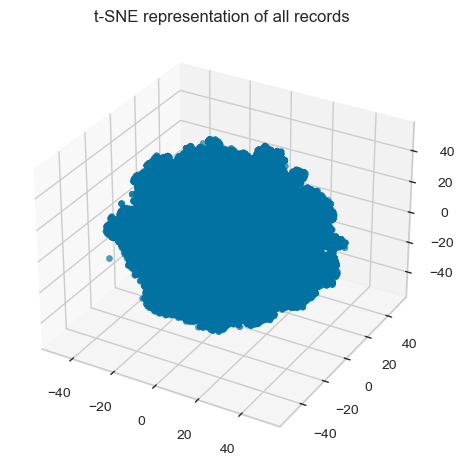

In [9]:
x = df_tsne['col_0']
y = df_tsne['col_1']
z = df_tsne['col_2']

# Create a 3D scatter plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z)

# Set a title for the plot
ax.set_title('t-SNE representation of all records')

# Save the plot as an image file (e.g., PNG)
plt.savefig('plots/df_tsne_representation.png')

# Show the plot
plt.show()


### Run the cell below to construct an interactive 3-d graph

In [10]:
fig = px.scatter_3d(df_tsne, x='col_0', y='col_1', z='col_2')
fig.show()

In [ ]:
# df_tsne.to_csv(r"data/df_tsne_3components.csv", index=False)

### [UMAP (Uniform Manifold Approximation and Projection)](https://pair-code.github.io/understanding-umap/)

In [193]:
import umap


n_components = 3

umap_model = umap.UMAP(n_components=n_components)
df_umap = umap_model.fit_transform(df_encoded)
df_umap = pd.DataFrame(df_umap, columns=cols_3)

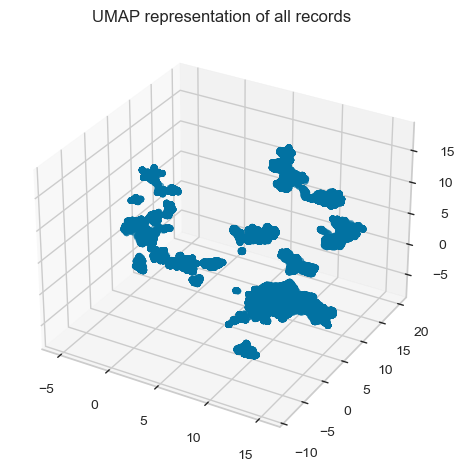

In [52]:
x = df_umap['col_0']
y = df_umap['col_1']
z = df_umap['col_2']

# Create a 3D scatter plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z)

# Set a title for the plot
ax.set_title('UMAP representation of all records')

# Save the plot as an image file (e.g., PNG)
plt.savefig('plots/df_umap_representation.png')

# Show the plot
plt.show()


### Run the cell below to construct an interactive 3-d graph

In [54]:
# fig = px.scatter_3d(df_umap, x='col_0', y='col_1', z='col_2')
# fig.show()

### Seems like UMAP made a way better job on clusterin (at this time, I am not sure how many separate clusters to choose, but visually it is much better distributed now)

In [195]:
# df_umap.to_csv(r"data/df_umap_3components.csv", index=False)

---

## <span style='color:#ff5f27'>🤖 Dimensinality reduction using [PCA (Principal Component Analysis)](https://builtin.com/data-science/step-step-explanation-principal-component-analysis)

### I will start with applying the default `PCA` algorithm to this sparse categorical data.

### Lets determine the optimal value for `PCA`'s `n_components` hyperparameter to reduce the dimensionality and computational complexity

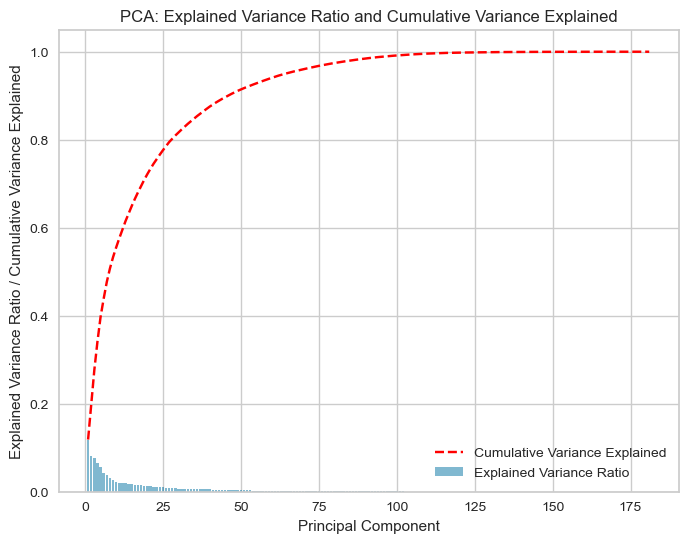

In [165]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA


# Perform PCA
pca = PCA()
pca.fit(df_encoded)

# Get the explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Calculate the cumulative variance explained
cumulative_variance = np.cumsum(explained_variance_ratio)

# Create a bar plot for the explained variance ratio
plt.figure(figsize=(8, 6))
plt.bar(np.arange(1, len(explained_variance_ratio) + 1), explained_variance_ratio, align='center', alpha=0.5, label='Explained Variance Ratio')
plt.plot(np.arange(1, len(cumulative_variance) + 1), cumulative_variance, marker='', linestyle='--', color='red', label='Cumulative Variance Explained')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio / Cumulative Variance Explained')
plt.title('PCA: Explained Variance Ratio and Cumulative Variance Explained')
plt.legend()
plt.grid(True)
plt.show()


In [44]:
for information_threshold in [0.75, 0.8, 0.85, 0.9, 0.92, 0.95, 0.975]:
    cum_var = cumulative_variance[cumulative_variance <= information_threshold]
    n_cols = len(cum_var)
    n_cols_frac = round(n_cols / df_encoded.shape[1] * 100, 2)
    overall = round(cum_var[-1] * 100, 3)
    print(f"First {n_cols} synthetic features ({n_cols_frac}% of all features) contain {overall}% of variance")

First 22 synthetic features (12.15% of all features) contain 74.537% of variance
First 27 synthetic features (14.92% of all features) contain 79.465% of variance
First 35 synthetic features (19.34% of all features) contain 84.808% of variance
First 45 synthetic features (24.86% of all features) contain 89.673% of variance
First 51 synthetic features (28.18% of all features) contain 91.721% of variance
First 64 synthetic features (35.36% of all features) contain 94.958% of variance
First 80 synthetic features (44.2% of all features) contain 97.432% of variance


### I decided to use `n_compoments=45` to preprocess our data using PCA before passing it to clustering algorithms

In [48]:
n_components = 45
pca = PCA(n_components=n_components, random_state=42)
pca.fit(df_encoded)
new_cols = ["col_" + str(i) for i in range(n_components)]
df_pca = pd.DataFrame(pca.transform(df_encoded), columns=new_cols)
df_pca.head(3)

,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,col_10,col_11,col_12,col_13,col_14,col_15,col_16,col_17,col_18,col_19,col_20,col_21,col_22,col_23,col_24,col_25,col_26,col_27,col_28,col_29,col_30,col_31,col_32,col_33,col_34,col_35,col_36,col_37,col_38,col_39,col_40,col_41,col_42,col_43,col_44
0,0.459976,2.100331,0.733644,0.737380,0.252923,-0.629029,-0.206446,-0.760119,0.092623,-0.020258,0.368855,0.160975,0.084139,-0.166641,0.311696,-0.081270,-0.042461,-0.405728,0.780064,-0.162960,0.104970,-0.050350,-0.302104,-0.132218,-0.042323,0.009933,0.027202,0.040265,-0.002556,-0.108222,0.032847,-0.229105,-0.117238,0.275249,0.058921,0.078753,-0.319038,-0.075540,0.004908,-0.004953,0.030822,-0.038805,0.079933,0.147951,-0.085766
1,1.271490,0.674422,-0.608776,-0.658124,0.399735,-0.489393,-0.117504,0.584213,-0.275337,0.233135,0.407686,0.680385,-0.241672,-0.312046,-0.726061,0.307132,-0.103246,-0.077617,0.192057,0.048217,0.037601,-0.196874,-0.299788,-0.061363,0.057662,-0.078717,-0.162231,-0.172444,0.017485,-0.071139,0.347844,-0.324446,-0.000945,0.213732,0.019087,0.112036,-0.307115,-0.068250,0.010879,0.041187,0.042627,-0.049297,0.033409,0.127649,-0.005775
2,1.166004,1.073161,-0.627419,-0.982511,0.305839,0.085781,-0.190883,0.374426,0.738760,-0.029426,0.665889,0.247284,0.134966,-0.150318,-0.239042,0.246623,0.455667,-0.332674,-0.005101,0.274335,0.097333,0.074756,-0.244058,-0.369230,-0.200667,-0.102739,-0.133079,-0.148931,0.249371,-0.425335,0.036866,-0.016253,0.002543,0.174918,0.017853,-0.125244,-0.255463,-0.042927,0.007810,0.040696,-0.017234,-0.181943,-0.019154,-0.078050,0.150759


In [103]:
# df_pca.to_csv(r"data/df_pca_45components.csv", index=False)

---

## <span style='color:#ff5f27'>🤖 Dimensinality reduction using [MCA (Multiple Correspondence Analysis)](https://en.wikipedia.org/wiki/Multiple_correspondence_analysis)

### Next, let's try `MCA`, as it is believed to work best with categorical data.

### Lets determine the optimal value for `MCA`'s `n_components` hyperparameter to reduce the dimensionality and computational complexity

In [146]:
!pip install prince --q

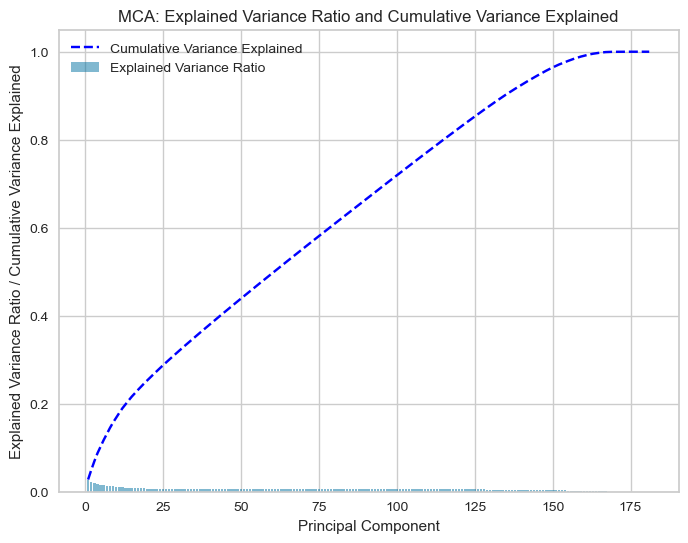

In [173]:
from prince import MCA

mca = MCA(n_components=df_encoded.shape[1])
mca.fit(df_encoded)

# Get the explained variance ratio
explained_variance_ratio = mca.percentage_of_variance_ / 100 # I divide it by 100 cause it is in percents originally

# Calculate the cumulative variance explained
cumulative_variance = np.cumsum(explained_variance_ratio)

# Create a bar plot for the explained variance ratio
plt.figure(figsize=(8, 6))
plt.bar(np.arange(1, len(explained_variance_ratio) + 1), explained_variance_ratio, align='center', alpha=0.5, label='Explained Variance Ratio')
plt.plot(np.arange(1, len(cumulative_variance) + 1), cumulative_variance, marker='', linestyle='--', color='blue', label='Cumulative Variance Explained')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio / Cumulative Variance Explained')
plt.title('MCA: Explained Variance Ratio and Cumulative Variance Explained')
plt.legend()
plt.grid(True)
plt.show()


In [174]:
print("Multiple correspondence analysis (MCA):")
print()
for information_threshold in [0.75, 0.8, 0.85, 0.9, 0.92, 0.95, 0.975]:
    cum_var = cumulative_variance[cumulative_variance <= information_threshold]
    n_cols = len(cum_var)
    n_cols_frac = round(n_cols / df_encoded.shape[1] * 100, 2)
    overall = round(cum_var[-1] * 100, 3)
    print(f"First {n_cols} synthetic features ({n_cols_frac}% of all features) contain {overall}% of variance")

Multiple correspondence analysis (MCA):

First 105 synthetic features (58.01% of all features) contain 74.617% of variance
First 114 synthetic features (62.98% of all features) contain 79.474% of variance
First 124 synthetic features (68.51% of all features) contain 84.751% of variance
First 134 synthetic features (74.03% of all features) contain 89.761% of variance
First 138 synthetic features (76.24% of all features) contain 91.59% of variance
First 146 synthetic features (80.66% of all features) contain 94.934% of variance
First 153 synthetic features (84.53% of all features) contain 97.364% of variance


## I decided to use `n_compoments=134` to preprocess our data using `MCA` before passing it to **clustering algorithms** 

In [179]:
n_components = 134
mca = MCA(n_components=n_components, random_state=42)
df_mca = mca.fit_transform(df_encoded)
new_cols = ["col_" + str(i) for i in range(n_components)]
df_mca.columns = new_cols
df_mca.head(3)

,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,col_10,col_11,col_12,col_13,col_14,col_15,col_16,col_17,col_18,col_19,col_20,col_21,col_22,col_23,col_24,col_25,col_26,col_27,col_28,col_29,col_30,col_31,col_32,col_33,col_34,col_35,col_36,col_37,col_38,col_39,col_40,col_41,col_42,col_43,col_44,col_45,col_46,col_47,col_48,col_49,col_50,col_51,col_52,col_53,col_54,col_55,col_56,col_57,col_58,col_59,col_60,col_61,col_62,col_63,col_64,col_65,col_66,col_67,col_68,col_69,col_70,col_71,col_72,col_73,col_74,col_75,col_76,col_77,col_78,col_79,col_80,col_81,col_82,col_83,col_84,col_85,col_86,col_87,col_88,col_89,col_90,col_91,col_92,col_93,col_94,col_95,col_96,col_97,col_98,col_99,col_100,col_101,col_102,col_103,col_104,col_105,col_106,col_107,col_108,col_109,col_110,col_111,col_112,col_113,col_114,col_115,col_116,col_117,col_118,col_119,col_120,col_121,col_122,col_123,col_124,col_125,col_126,col_127,col_128,col_129,col_130,col_131,col_132,col_133
0,0.035733,-0.082807,0.374553,0.163462,-0.117120,0.068087,-0.113559,-0.056332,0.009329,0.004546,-0.046292,0.011095,0.004317,-0.025150,-0.019317,0.016535,-0.014229,0.135303,0.033123,0.003018,-0.060362,-0.032992,-0.054634,-0.044161,0.109914,0.065663,0.056738,0.190417,-0.167562,0.135605,0.080369,0.084550,-0.101355,0.017908,-0.016377,-0.070690,0.002033,0.024663,-0.001750,-0.007677,-0.002724,-0.111303,-0.044420,0.129904,0.047120,-0.037784,-0.049995,-0.017647,-0.011297,0.024812,0.020758,-0.017984,0.019228,0.045997,0.026443,0.011145,0.007212,-0.024091,-0.006713,0.009168,0.018181,0.022515,-0.002017,-0.018302,-0.072838,-0.063876,0.049161,0.036250,-0.014710,-0.005675,-0.008060,0.008322,-0.026005,-0.012420,0.015662,-0.003736,0.009304,-0.002976,-0.046895,-0.003971,0.017565,0.013844,-0.003444,0.005617,-0.013816,0.003977,0.000394,0.008853,-0.005960,0.011438,0.005875,-0.013320,0.011666,0.016684,-0.009602,0.015232,0.023177,-0.035576,0.024644,-0.017198,0.006665,0.004259,0.006198,-0.006641,-0.006334,0.039266,0.008352,-0.031414,0.037276,-0.022299,-0.011749,0.024896,-0.005323,-0.016566,0.004135,-0.036528,-0.032473,0.034682,0.024185,-0.065155,0.016689,0.079061,-0.033415,0.010618,0.024557,-0.093096,0.138824,-0.061393,0.106340,0.106568,-0.135016,-0.021059,-0.065653,0.181685
1,0.209957,0.095575,-0.037427,0.124028,-0.098772,0.044943,-0.063284,-0.078073,-0.049800,-0.028163,0.026949,-0.015977,-0.052310,0.091228,-0.002907,0.080649,-0.084845,0.008194,-0.039501,-0.066381,-0.061314,-0.115885,0.017111,-0.010916,-0.041263,0.119100,0.011857,0.011213,0.046667,0.060061,-0.090433,0.032055,0.004952,-0.016482,-0.022072,0.016737,-0.002508,0.021309,-0.021319,-0.016164,-0.046298,0.009863,0.068736,-0.036082,-0.036762,0.066008,-0.056233,0.080207,-0.003460,0.031651,-0.004021,0.025311,-0.008994,0.039287,-0.068795,-0.027177,-0.101154,-0.142276,-0.022940,-0.053242,-0.028221,0.087170,0.056510,0.081232,-0.128973,-0.046800,-0.080377,-0.169203,0.164141,0.008412,-0.102344,-0.214602,0.010542,0.143056,-0.088766,0.043358,0.161076,0.027462,0.010050,0.109426,-0.002560,0.027886,0.026678,-0.023280,0.004015,0.048609,-0.014330,-0.027045,-0.004605,-0.018573,-0.053673,-0.061114,-0.008900,-0.059667,-0.046363,-0.078585,0.041839,0.099816,0.136470,-0.008038,-0.106706,0.006143,0.016283,-0.000774,0.035460,-0.053509,0.010559,-0.064840,0.030724,0.017894,-0.070824,-0.033709,0.027326,-0.004573,0.023768,0.062056,0.023746,-0.063705,-0.073128,0.038877,0.025718,-0.038566,0.006916,-0.038951,0.065496,0.020058,0.003773,0.031950,0.044948,-0.052026,0.027466,-0.024426,-0.046641,0.053664
2,0.254284,0.183640,-0.030706,0.133316,-0.115085,-0.008445,-0.076358,-0.103212,-0.042234,-0.057697,0.127259,0.041160,-0.057640,0.008934,0.021252,-0.087443,0.011252,-0.111744,-0.035084,-0.012246,0.055542,-0.005114,-0.056018,0.068737,0.088444,-0.004766,-0.003574,-0.006134,0.037603,0.085267,-0.065503,0.051551,0.040319,-0.075187,-0.061240,-0.070586,0.039339,-0.010081,0.072762,0.014347,0.072011,-0.022003,0.050232,0.006061,-0.029887,0.006505,-0.066223,0.078364,-0.070369,-0.003865,-0.03506

In [180]:
# df_mca.to_csv(r"data/df_mca_134components.csv", index=False)

---

## <span style='color:#ff5f27'>🤖 Dimensinality reduction using UMAP

In [14]:
!pip install umap-learn --q

### Lets try to find the optimal n_components value for `UMAP` algorithm

In [137]:
import time

time.ctime()

'Thu Aug 17 23:13:52 2023'

Cumulative Distance Preservation is a heuristic metric used to assess the quality of a dimensionality reduction technique, such as UMAP, in preserving pairwise distances between data points as they are projected from a higher-dimensional space to a lower-dimensional space.

The basic idea behind Cumulative Distance Preservation is to compare the average pairwise distances between data points in the original high-dimensional space with the average pairwise distances in the lower-dimensional space after dimensionality reduction. If the average pairwise distances are well-preserved in the lower-dimensional space, it indicates that the data's local and global structures are being maintained to a reasonable extent.

The formula to calculate Cumulative Distance Preservation is as follows:

`Cumulative Distance Preservation = (Average pairwise distances in lower-dimensional space) / (Average pairwise distances in original high-dimensional space)
`


In simpler terms, the Cumulative Distance Preservation value greater than 1 indicates that the dimensionality reduction method has effectively preserved the pairwise distances, while a value less than 1 indicates that distances are not well-preserved.

**The greater this value - the better**

We are starting now.
Thu Aug 17 23:18:15 2023
******************************************************

Applying UMAP with num_components=3...
Done.
Thu Aug 17 23:19:32 2023

Applying UMAP with num_components=4...
Done.
Thu Aug 17 23:20:49 2023

Applying UMAP with num_components=5...
Done.
Thu Aug 17 23:22:08 2023

Applying UMAP with num_components=6...
Done.
Thu Aug 17 23:23:28 2023

Applying UMAP with num_components=7...
Done.
Thu Aug 17 23:24:50 2023

Applying UMAP with num_components=8...
Done.
Thu Aug 17 23:26:12 2023

Applying UMAP with num_components=9...
Done.
Thu Aug 17 23:27:37 2023

Applying UMAP with num_components=10...
Done.
Thu Aug 17 23:29:08 2023

Applying UMAP with num_components=11...
Done.
Thu Aug 17 23:30:42 2023

Applying UMAP with num_components=12...
Done.
Thu Aug 17 23:32:16 2023

Applying UMAP with num_components=13...
Done.
Thu Aug 17 23:33:53 2023

Applying UMAP with num_components=14...
Done.
Thu Aug 17 23:35:29 2023



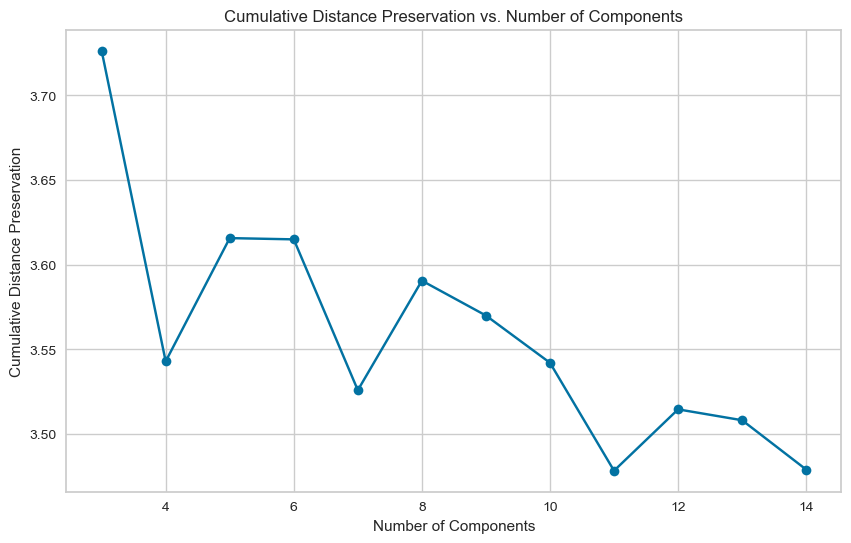



The end of a script.
Thu Aug 17 23:35:29 2023


In [140]:
print("We are starting now.")
print(time.ctime())
print("*" * 54)
print()

# Assuming one_hot_encoded_data is your one-hot encoded data
num_components_range = range(3, 15)  # You can adjust the range
cumulative_distance_preservation = []

for num_components in num_components_range:
    print(f"Applying UMAP with num_components={num_components}...")
    umap_model = umap.UMAP(n_components=num_components, n_neighbors=15, min_dist=0.1)
    reduced_data = umap_model.fit_transform(df_encoded)

    # Calculate the average pairwise Euclidean distance in the original data
    original_distances = np.linalg.norm(df_encoded - np.mean(df_encoded, axis=0), axis=1)
    avg_original_distance = np.mean(original_distances)

    # Calculate the average pairwise Euclidean distance in the UMAP embedding
    umap_distances = np.linalg.norm(reduced_data - np.mean(reduced_data, axis=0), axis=1)
    avg_umap_distance = np.mean(umap_distances)

    # Calculate the ratio of average distances preserved
    distance_preservation = avg_umap_distance / avg_original_distance
    cumulative_distance_preservation.append(distance_preservation)
    print("Done.")
    print(time.ctime())
    print()

# Plot the Cumulative Distance Preservation
plt.figure(figsize=(10, 6))
plt.plot(num_components_range, cumulative_distance_preservation, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Distance Preservation')
plt.title('Cumulative Distance Preservation vs. Number of Components')
plt.grid(True)
plt.show()

print()
print()
print("The end of a script.")
print(time.ctime())

## Seems like `n_components=3` is the optimal value here for `UMAP`

We already got dataframe transformed using UMAP with `n_components=3`

In [193]:
# import umap


# n_components = 3

# umap_model = umap.UMAP(n_components=n_components)
# df_umap = umap_model.fit_transform(df_encoded)
# new_cols = ["col_" + str(i) for i in range(n_components)]
# df_umap = pd.DataFrame(df_umap, columns=new_cols)

In [195]:
# df_umap.to_csv(r"data/df_umap_3components.csv", index=False)

---

# I stopper HERE
## 8/18/2023

# Analyzing clusters

In [93]:
# cluster_centroids_umap = kmeans.cluster_centers_
# cluster_centroids_original = umap.inverse_transform(cluster_centroids_umap)

# # Create a DataFrame for cluster centroids and binary features
# cluster_centroids_df = pd.DataFrame(cluster_centroids_original, columns=df_encoded.columns)

## Now lets display the cluster centroids as representative points. 

## Then, create a heatmap that shows the binary feature values for each cluster's centroid. The heatmap will provide an overview of how the binary features differ between clusters.

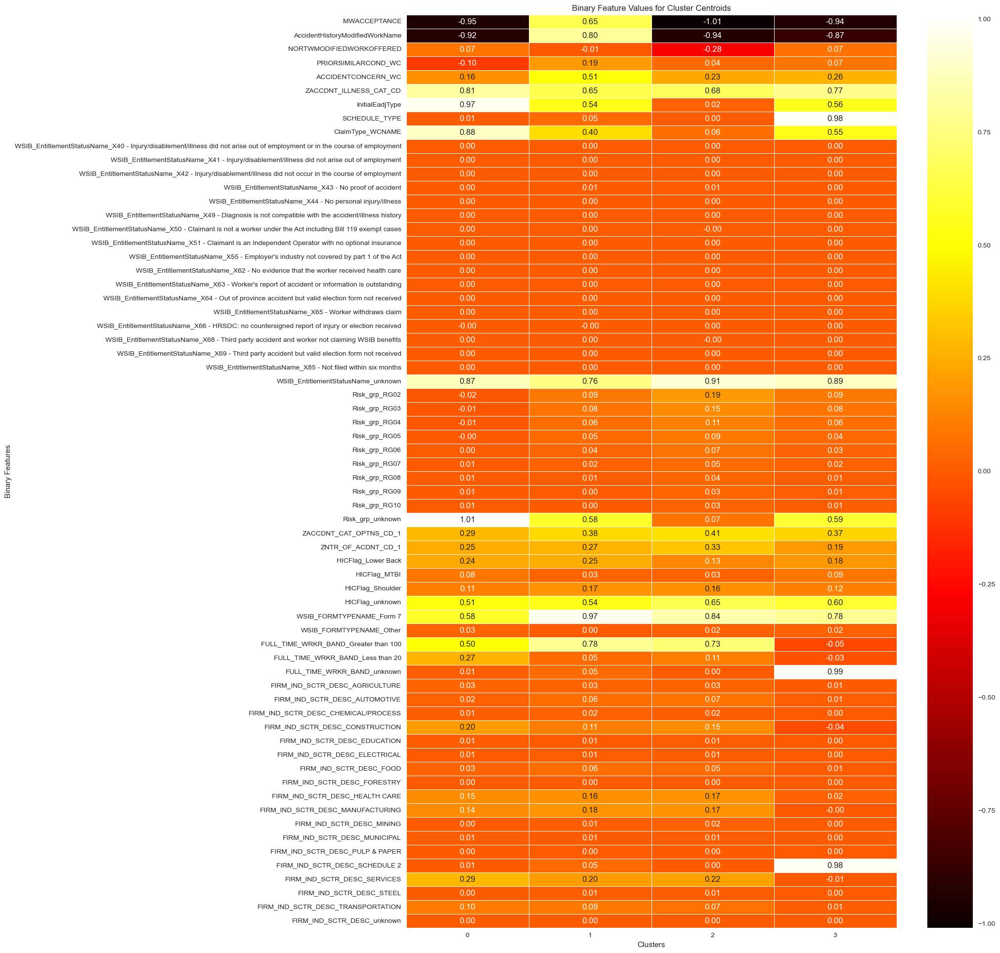

In [18]:
cluster_centroids_df_transposed = cluster_centroids_df.T

# Plot the heatmap with rotated numbers inside the cells
plt.figure(figsize=(16, 24))
sns.heatmap(cluster_centroids_df_transposed, cmap='hot', annot=True, fmt=".2f", linewidths=0.5)
plt.title("Binary Feature Values for Cluster Centroids")
plt.xlabel("Clusters")
plt.ylabel("Binary Features")
plt.show()

### Now, I calculate the range or variance for each row and then sort them in descending order. The greater the range or variance, the more significant the differences across the features

In [19]:
# Calculate the range (max - min) for each row
x = cluster_centroids_df_transposed.copy()
x['Range'] = x.iloc[:, 1:].max(axis=1) - x.iloc[:, 1:].min(axis=1)

# Sort the DataFrame by the 'Range' column in descending order
most_significant_indexes = x.sort_values(by='Range', ascending=False)

most_significant_indexes.head(5)

,0,1,2,3,Range
AccidentHistoryModifiedWorkName,-0.922825,0.800225,-0.937071,-0.870911,1.737296
MWACCEPTANCE,-0.950881,0.648224,-1.009429,-0.938790,1.657653
FULL_TIME_WRKR_BAND_unknown,0.009384,0.050570,0.004742,0.986721,0.981979
SCHEDULE_TYPE,0.005219,0.049864,0.003431,0.980016,0.976585
FIRM_IND_SCTR_DESC_SCHEDULE 2,0.005132,0.049869,0.003377,0.979513,0.976136


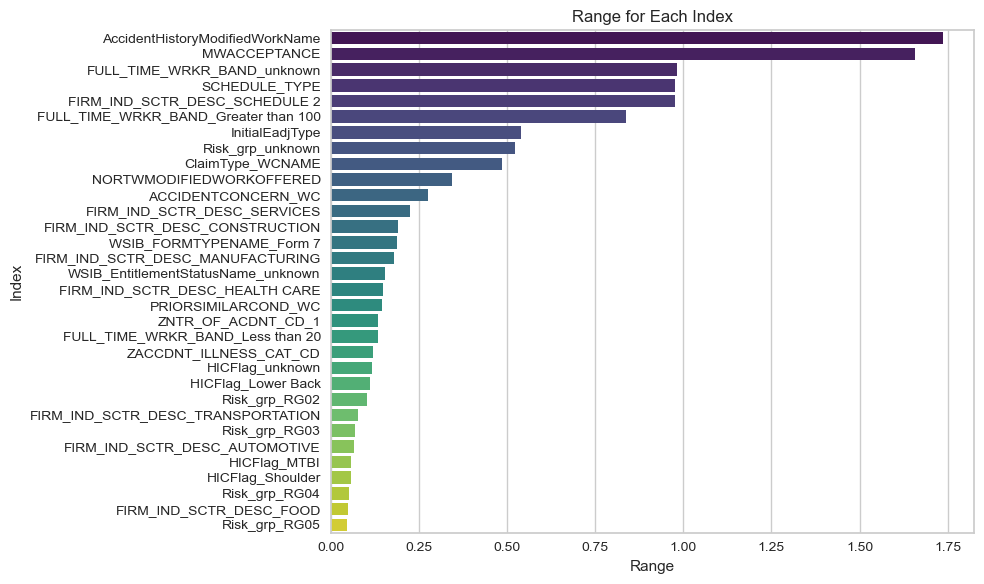

In [20]:
# Create a bar chart using seaborn to visualize the Range for each index
plt.figure(figsize=(10, 6))
sns.barplot(x='Range', y=most_significant_indexes.head(32).index,
            data=most_significant_indexes.head(32), palette='viridis')
plt.xlabel('Range')
plt.ylabel('Index')
plt.title('Range for Each Index')

plt.tight_layout()
plt.show()

In [21]:
kmeans_cols_choice = most_significant_indexes.head(15)
kmeans_cols_choice

,0,1,2,3,Range
AccidentHistoryModifiedWorkName,-0.922825,0.800225,-0.937071,-0.870911,1.737296
MWACCEPTANCE,-0.950881,0.648224,-1.009429,-0.938790,1.657653
FULL_TIME_WRKR_BAND_unknown,0.009384,0.050570,0.004742,0.986721,0.981979
SCHEDULE_TYPE,0.005219,0.049864,0.003431,0.980016,0.976585
FIRM_IND_SCTR_DESC_SCHEDULE 2,0.005132,0.049869,0.003377,0.979513,0.976136
FULL_TIME_WRKR_BAND_Greater than 100,0.498365,0.784987,0.727664,-0.053260,0.838247
InitialEadjType,0.974131,0.538138,0.017124,0.556009,0.538885
Risk_grp_unknown,1.008408,0.575020,0.071143,0.592741,0.521598
ClaimType_WCNAME,0.882517,0.396578,0.060196,0.546765,0.486569
NORTWMODIFIEDWORKOFFERED,0.072052,-0.005246,-0.278572,0.067130,0.345702


### The heatmap, created using KMeans centroids, suggests take a closer look at the next features:
- **'AccidentHistoryModifiedWorkName'**,
- **'MWACCEPTANCE'**,
- 'FULL_TIME_WRKR_BAND_unknown',
- 'SCHEDULE_TYPE',
- 'FIRM_IND_SCTR_DESC_SCHEDULE 2',
- 'FULL_TIME_WRKR_BAND_Greater than 100',
- 'InitialEadjType',
- 'Risk_grp_unknown',
- 'ClaimType_WCNAME',
- 'NORTWMODIFIEDWORKOFFERED',
- 'ACCIDENTCONCERN_WC' ...

## Approach using Random Forest to determine the most crucial features

In [22]:
from sklearn.ensemble import RandomForestClassifier

y = kmeans.labels_
rf_clf = RandomForestClassifier()
rf_clf.fit(df_encoded, y)

RandomForestClassifier()

In [23]:
!pip install shap --q

In [24]:
# import shap

# explainer= shap.TreeExplainer(rf_clf)

# shap_values = explainer(df_encoded).values

In [25]:
# # Display a summary graph of the relative importance of each characteristic
# shap.summary_plot(shap_values, df_encoded)

# shap.dependence_plot(y, shap_values, df_encoded)

<Axes: ylabel='column_name'>

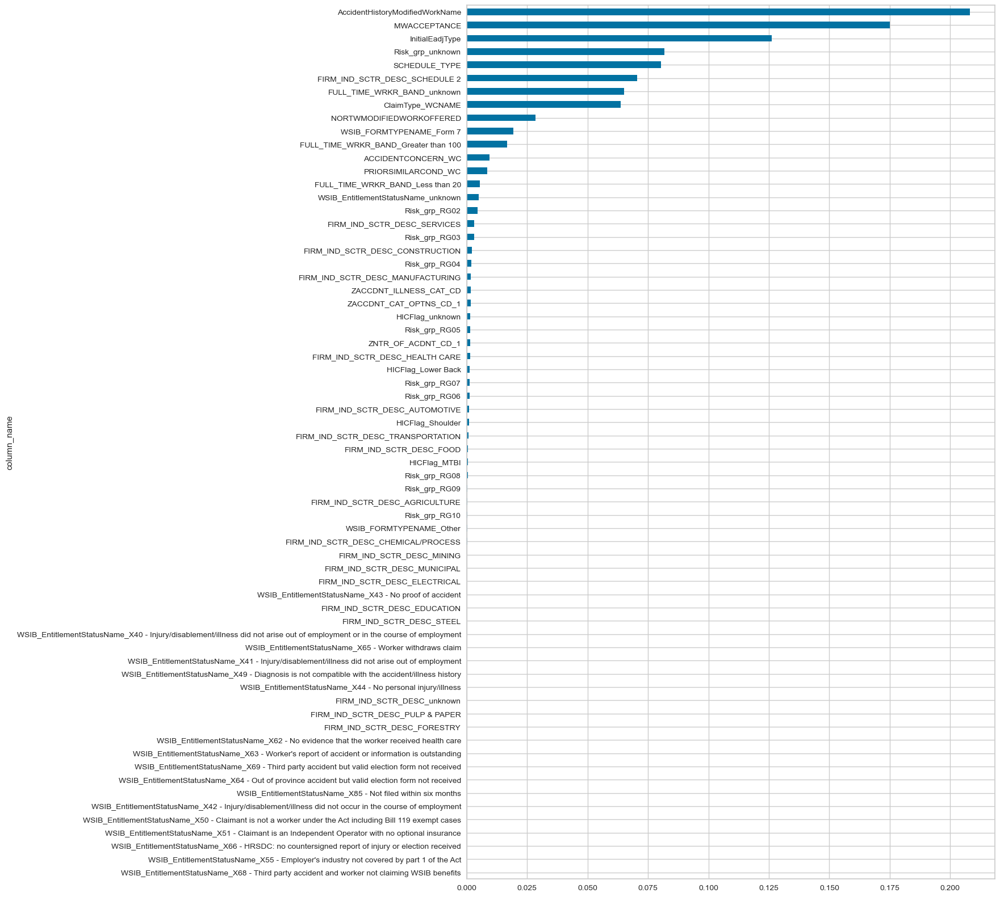

In [26]:
def rf_feature_importance(model, df):
    return pd.DataFrame({'column_name': df.columns, 'importance': model.feature_importances_}
                       ).sort_values('importance', ascending=True)

fi = rf_feature_importance(rf_clf, df_encoded)


def plot_fi(fi):
    return fi.plot('column_name', 'importance', 'barh', figsize=(12, 20), legend=False)

plot_fi(fi)

In [27]:
rf_cols_choice = fi.tail(18).sort_values('importance', ascending=False)
rf_cols_choice

,column_name,importance
1,AccidentHistoryModifiedWorkName,0.208042
0,MWACCEPTANCE,0.175056
6,InitialEadjType,0.126158
36,Risk_grp_unknown,0.081826
7,SCHEDULE_TYPE,0.080438
61,FIRM_IND_SCTR_DESC_SCHEDULE 2,0.070617
47,FULL_TIME_WRKR_BAND_unknown,0.065058
8,ClaimType_WCNAME,0.063758
2,NORTWMODIFIEDWORKOFFERED,0.028574
43,WSIB_FORMTYPENAME_Form 7,0.019212


### Most essential features, according to the Random Forest Classifier:
- **'AccidentHistoryModifiedWorkName'**
- **'MWACCEPTANCE'**
- **'InitialEadjType'**
- 'Risk_grp_unknown',
- 'SCHEDULE_TYPE',
- 'FIRM_IND_SCTR_DESC_SCHEDULE 2',
- 'FULL_TIME_WRKR_BAND_unknown',
- 'ClaimType_WCNAME' ...

---

# <span style='color:#ff5f27'>🔍 Looking at the essential features distributions

## Lets now union the features from `rf_cols_choice` and `kmeans_cols_choice` at look at the distributions of these essential features (they are mostly binary encoded)

In [28]:
most_important_cols = list(set(rf_cols_choice.column_name.to_list() + rf_cols_choice.column_name.to_list())) 

In [29]:
most_important_cols

['MWACCEPTANCE',
 'FULL_TIME_WRKR_BAND_unknown',
 'NORTWMODIFIEDWORKOFFERED',
 'Risk_grp_unknown',
 'WSIB_FORMTYPENAME_Form 7',
 'InitialEadjType',
 'ClaimType_WCNAME',
 'PRIORSIMILARCOND_WC',
 'FULL_TIME_WRKR_BAND_Greater than 100',
 'FULL_TIME_WRKR_BAND_Less than 20',
 'WSIB_EntitlementStatusName_unknown',
 'Risk_grp_RG02',
 'SCHEDULE_TYPE',
 'FIRM_IND_SCTR_DESC_SERVICES',
 'FIRM_IND_SCTR_DESC_SCHEDULE 2',
 'AccidentHistoryModifiedWorkName',
 'ACCIDENTCONCERN_WC',
 'Risk_grp_RG03']

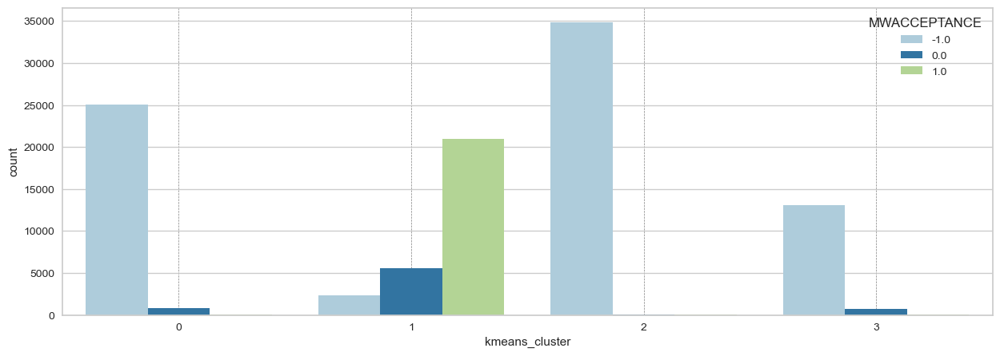

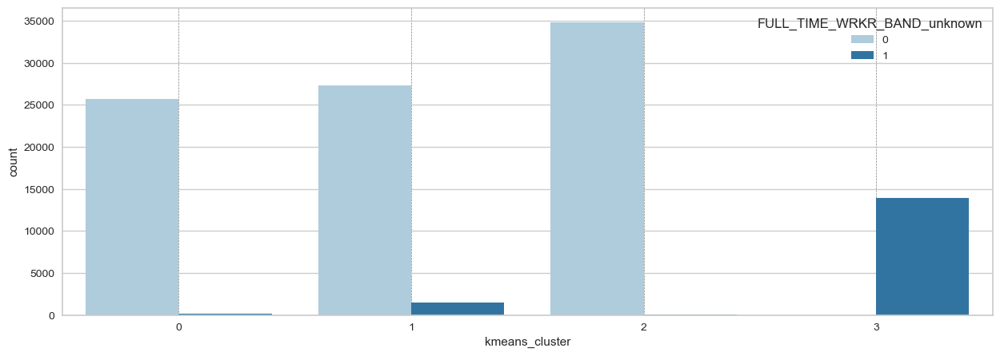

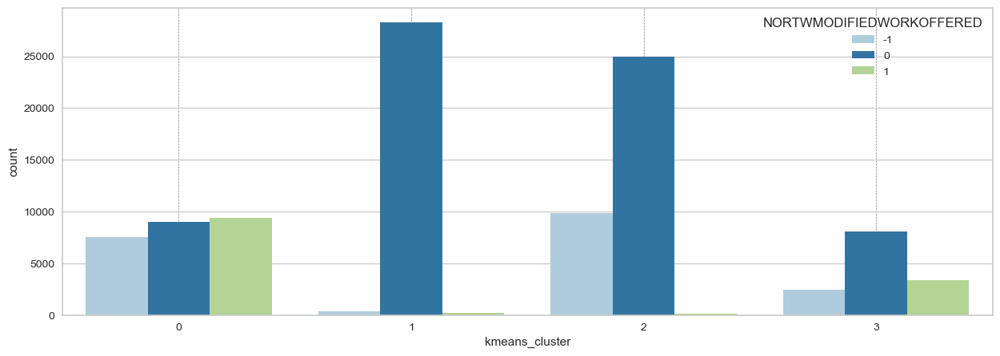

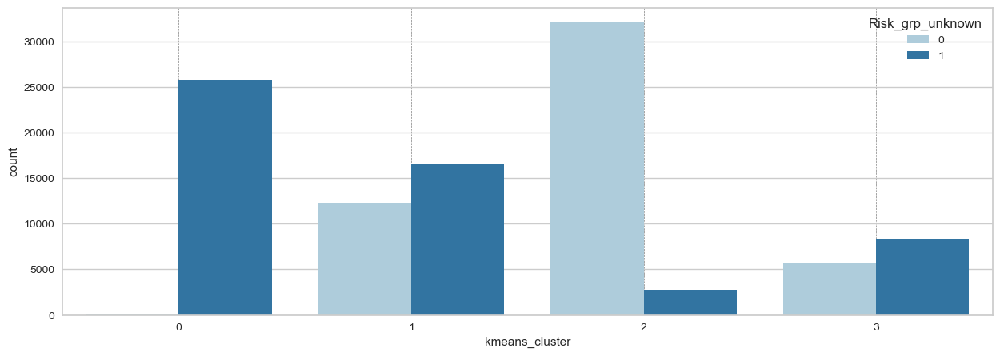

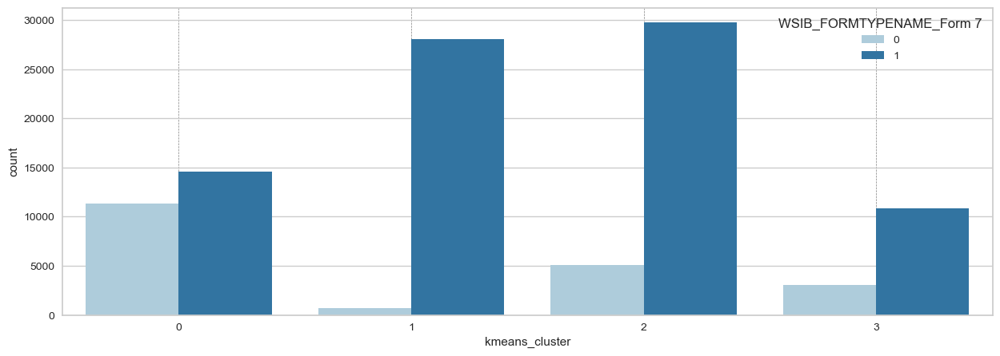

...

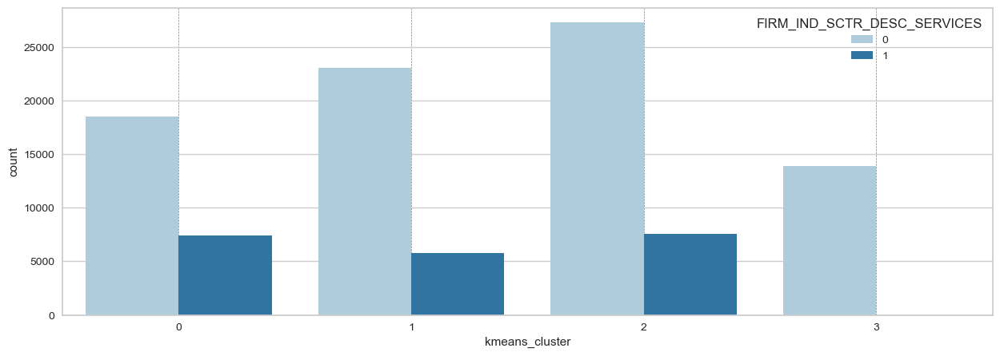

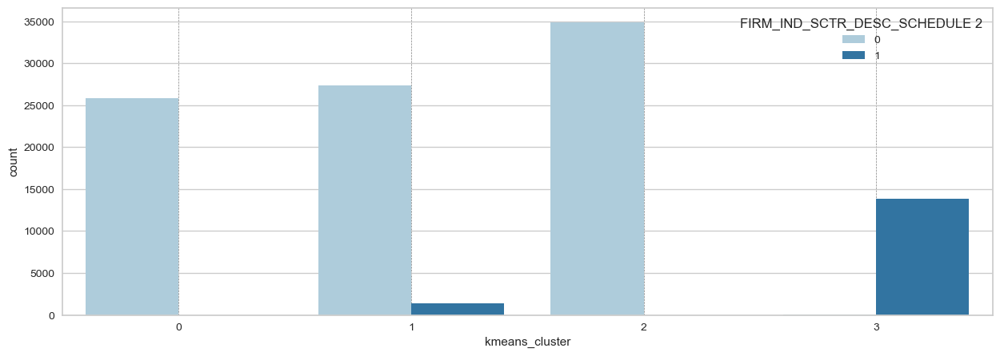

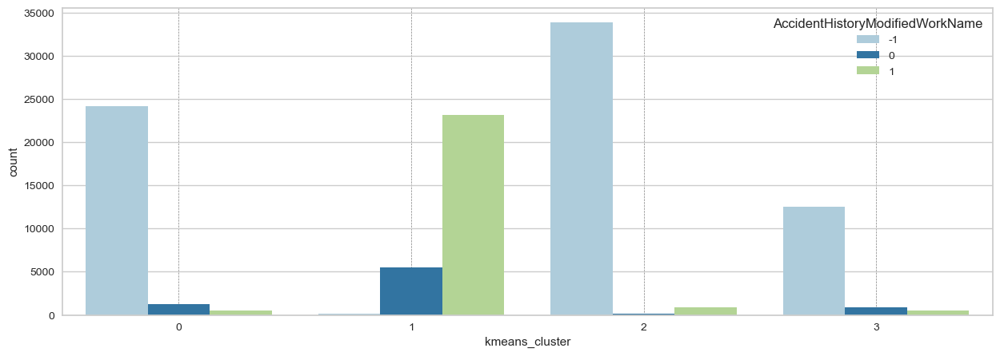

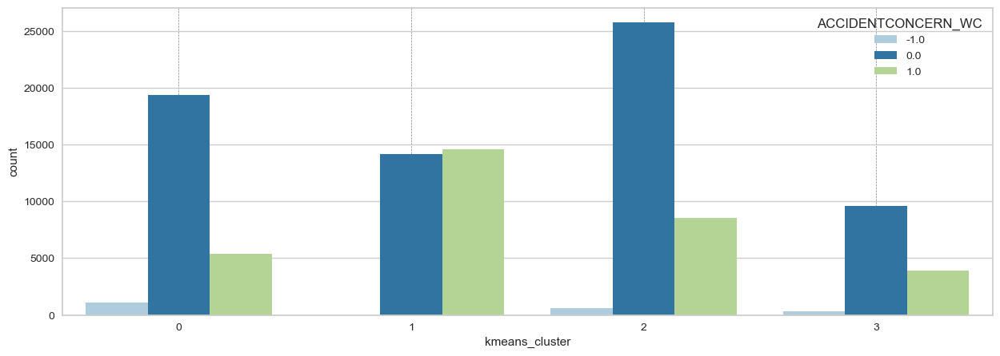

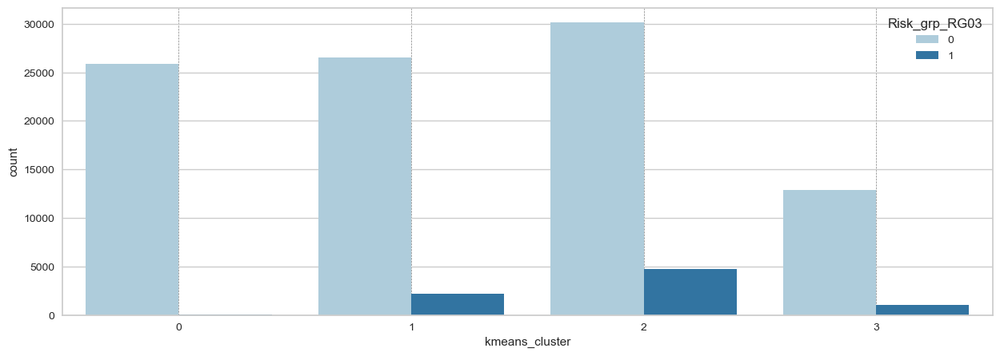

In [30]:
# vizualize the distributions of original features
# for col in df.columns:
for col in most_important_cols:
    plt.subplots(figsize=(15,5))
    sns.countplot(x=df['kmeans_cluster'], hue=col, data=df_encoded, palette='Paired')
    plt.grid(axis='x', linestyle='--', linewidth=0.5, color='gray')
    plt.show()

---

## Lets additionally look at all features distribution across clusters using original data

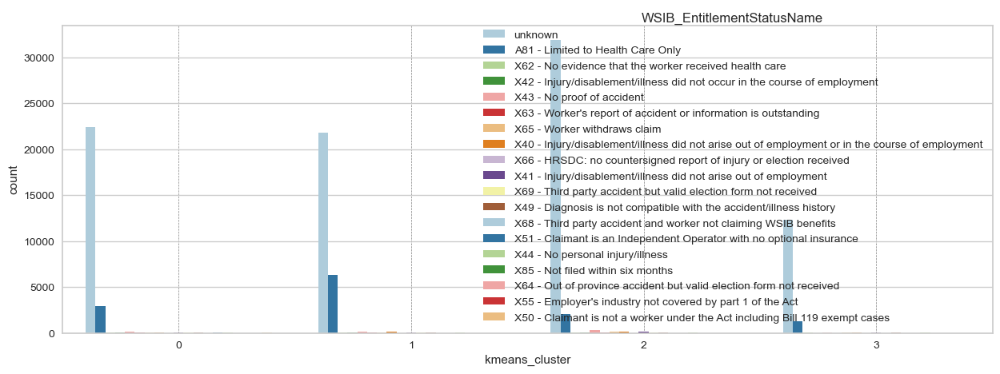

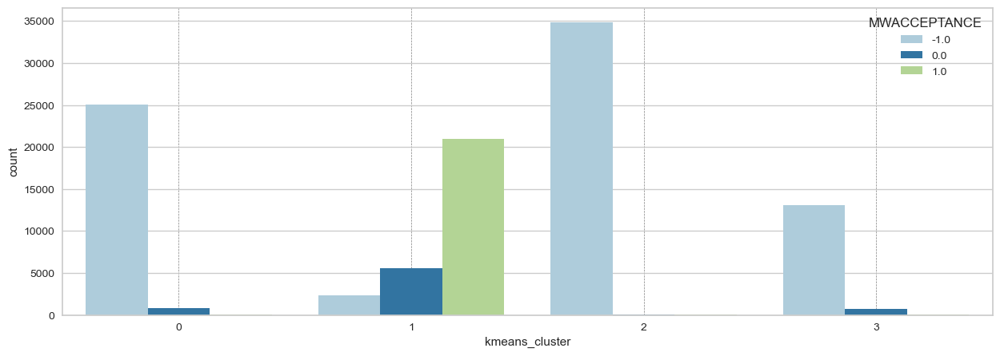

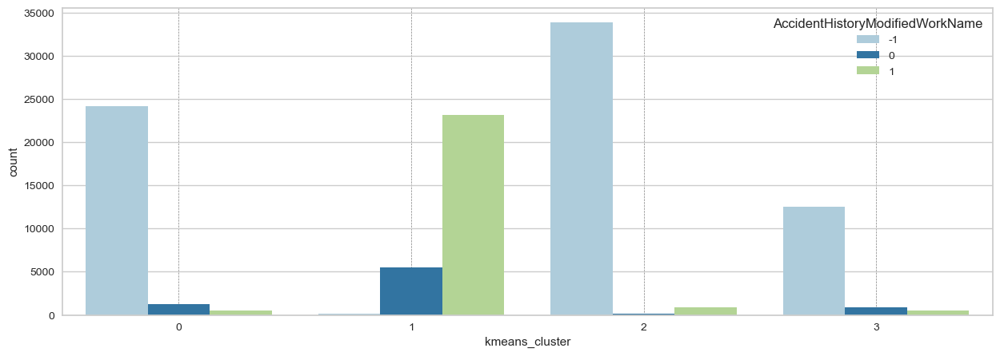

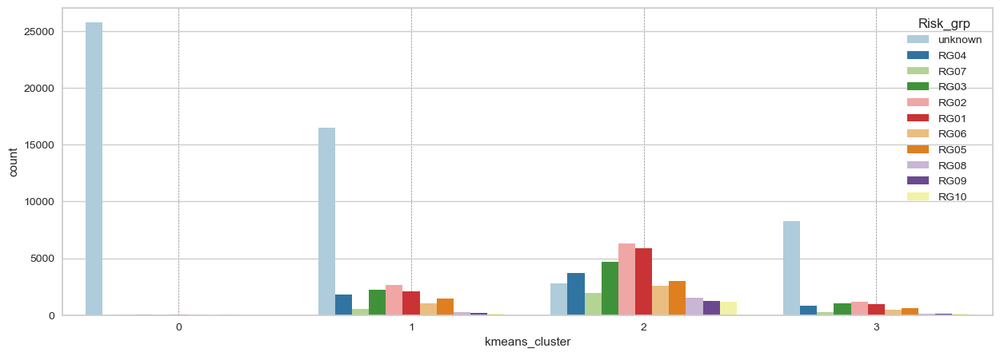

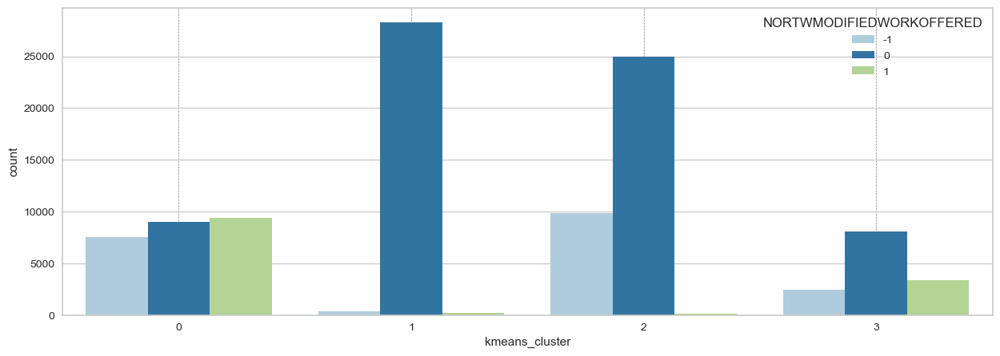

...

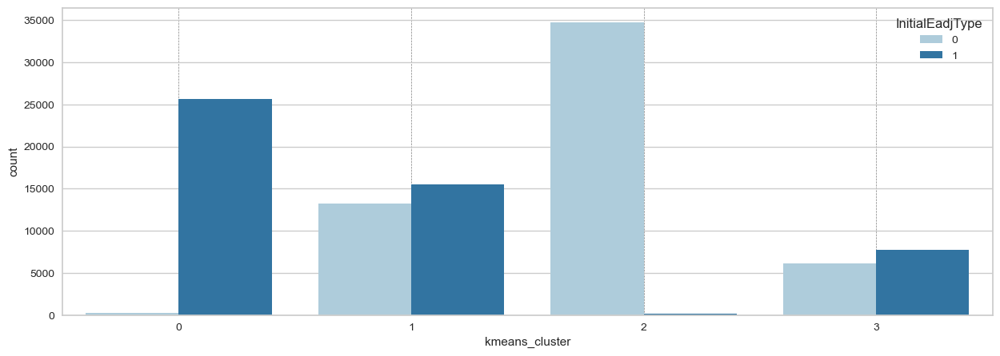

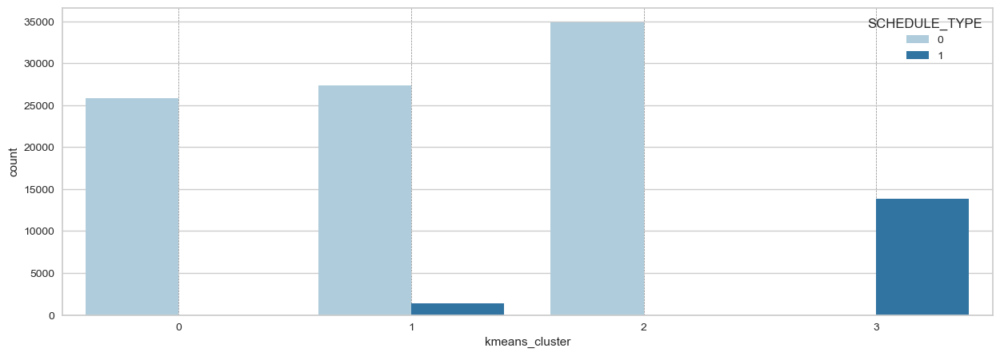

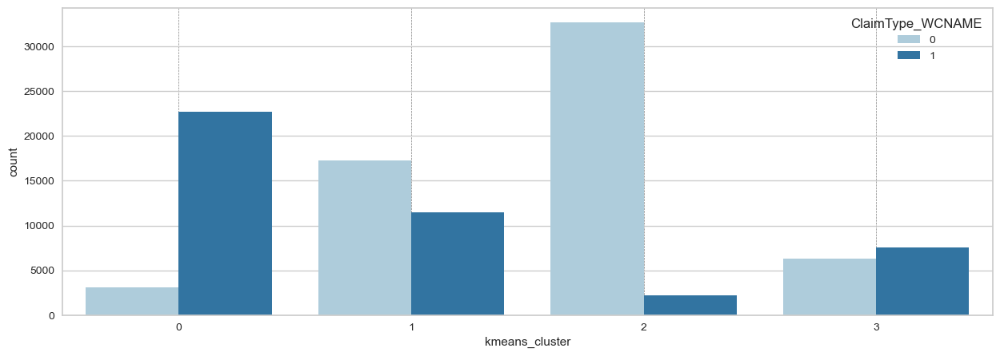

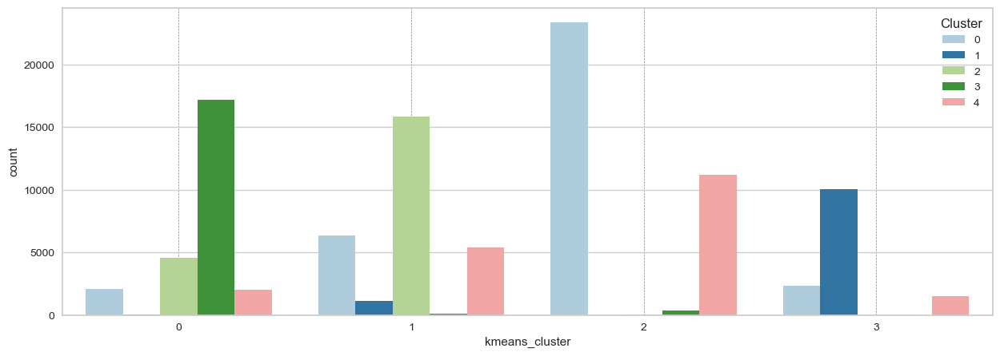

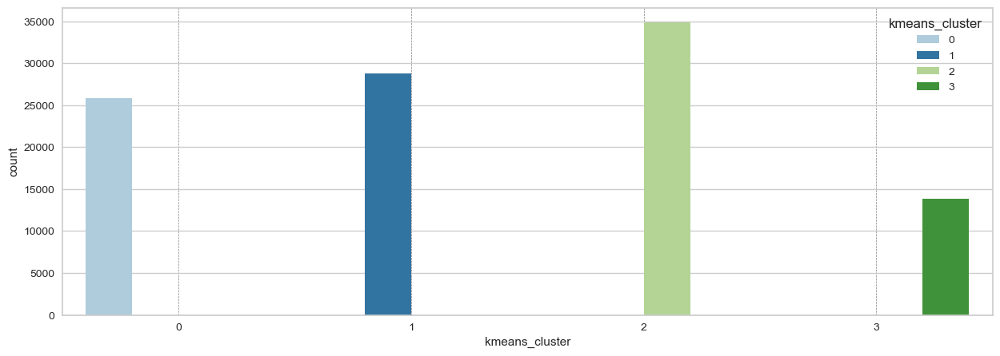

In [31]:
# vizualize the distributions of original features
for col in df.columns:
# for col in most_important_cols.column_name.values:
    plt.subplots(figsize=(15,5))
    sns.countplot(x='kmeans_cluster', hue=col, data=df, palette='Paired')
    plt.grid(axis='x', linestyle='--', linewidth=0.5, color='gray')
    plt.show()